# Mask R-CNN - Inspect Madrid Rooftops Detection Trained Model

Code and visualizations to test, debug, and evaluate the Mask R-CNN model.

In [142]:
import os
import sys
import random
import math
import re
import time
import numpy as np
import pandas as pd
import itertools
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.colors import LinearSegmentedColormap

# Root directory of the project
ROOT_DIR = os.path.abspath("../")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
from mrcnn import visualize
from mrcnn.visualize import display_images
import mrcnn.model as modellib
from mrcnn.model import log

from rooftops import *

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "model\\logs")

## Configurations

In [2]:
DATASET_DIR = os.path.join(ROOT_DIR, "data\\maps")

In [3]:
# define the prediction configuration
class PredictionConfig(Config):
    # define the name of the configuration
    NAME = "roof_cfg"
    # number of classes (background + roof)
    NUM_CLASSES = 1 + 3
    # simplify GPU config
    #GPU_COUNT = 1
    IMAGES_PER_GPU = 1

# create config
cfg = PredictionConfig()
cfg.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                16
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'mrcnn_mask_loss': 1.0, 'mrcnn_class_loss': 1.0, 'rpn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'rpn_bbox_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

## Notebook Preferences

In [4]:
# Device to load the neural network on.
# Useful if you're training a model on the same 
# machine, in which case use CPU and leave the
# GPU for training.
DEVICE = "/cpu:0"  # /cpu:0 or /gpu:0

# Inspect the model in training or inference modes
# values: 'inference' or 'training'
# TODO: code for 'training' test mode not ready yet
TEST_MODE = "inference"

In [5]:
def get_ax(rows=1, cols=1, size=16):
    """Return a Matplotlib Axes array to be used in
    all visualizations in the notebook. Provide a
    central point to control graph sizes.
    
    Adjust the size attribute to control how big to render images
    """
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

## Select Best Model

In [82]:
mAPs_df = pd.read_csv('../model/mAPs_df.csv', index_col=0)
mAPs_df = mAPs_df.sort_values(by='epoch')
mAPs_df.head(3)

,model_file,epoch,train_mAP,val_mAP
0,mask_rcnn_roof_cfg_0041.h5,41,0.660802,0.492666
1,mask_rcnn_roof_cfg_0042.h5,42,0.644798,0.462415
2,mask_rcnn_roof_cfg_0043.h5,43,0.642782,0.483545


In [102]:
mAPs_df.sort_values(by='val_mAP', ascending=False).head(3)

,model_file,epoch,train_mAP,val_mAP
38,mask_rcnn_roof_cfg_0060.h5,60,0.719928,0.526771
26,mask_rcnn_roof_cfg_0068.h5,68,0.667379,0.511124
19,mask_rcnn_roof_cfg_0061.h5,61,0.704618,0.509369


In [103]:
mAPs_df.sort_values(by='train_mAP', ascending=False).head(3)

,model_file,epoch,train_mAP,val_mAP
38,mask_rcnn_roof_cfg_0060.h5,60,0.719928,0.526771
31,mask_rcnn_roof_cfg_0073.h5,73,0.707507,0.496790
25,mask_rcnn_roof_cfg_0067.h5,67,0.706496,0.500304


### Plot mAP for epochs 41-80
We can see that epoch 60 has the best mAPs

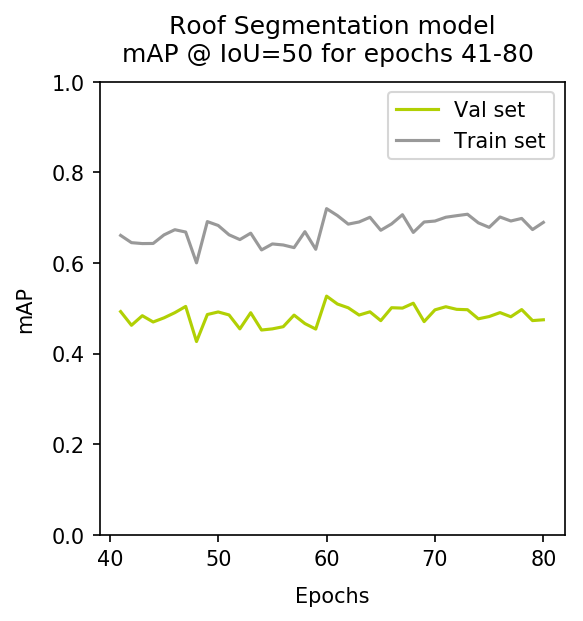

In [120]:
# Plot mAPs for 41-80 epochs trained
fig, ax = plt.subplots(1, figsize=(4, 4), dpi=150)
ax.set_title("Roof Segmentation model\nmAP @ IoU=50 for epochs 41-80 ", pad=10)
plt.xlabel('Epochs', labelpad=8)
#plt.xticks([0.2, 0.4, 0.6, 0.8, 1])
plt.ylabel('mAP', labelpad=8)
ax.set_ylim(0, 1.0)
#ax.set_xlim(0, 1.1)
_ = ax.plot(mAPs_df.epoch.values, mAPs_df.val_mAP.values, color = '#B1D004', label='Val set')
_ = ax.plot(mAPs_df.epoch.values, mAPs_df.train_mAP.values, color = '#999999', label='Train set')
plt.legend();
plt.savefig('images/mAPs.png', bbox_inches='tight', transparent=True)

## Load best model

In [124]:
# Create model in inference mode
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=cfg)

In [126]:
# Load the last model you trained
# weights_path = model.find_last()
# print("Loading weights ", weights_path)
# model.load_weights(weights_path, by_name=True)

# Load best model trained
best_model_path = MODEL_DIR + '\\roof_cfg20210921T2155\\mask_rcnn_roof_cfg_0060.h5'
print("Loading weights ", best_model_path)
model.load_weights(best_model_path, by_name=True)

Loading weights  C:\Users\casiopa\CURSOS\_TheBridge-DS\thebridgedsftjun21-Ana\3-Machine Learning\proyectos\Mask_RCNN\model\logs\roof_cfg20210921T2155\mask_rcnn_roof_cfg_0060.h5
Re-starting from epoch 60


### Loading `train_set`

In [8]:
train_set = RooftopDataset()
train_set.load_dataset(DATASET_DIR, "train")

# Must call before using the dataset
train_set.prepare()

print("Image Count: {}".format(len(train_set.image_ids)))
print("Class Count: {}".format(train_set.num_classes))
for i, info in enumerate(train_set.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 69
Class Count: 4
  0. BG                                                
  1. roof                                              
  2. pool                                              
  3. sports                                            


### Loading `val_set`

In [9]:
val_set = RooftopDataset()
val_set.load_dataset(DATASET_DIR, "val")

# Must call before using the dataset
val_set.prepare()

print("Image Count: {}".format(len(val_set.image_ids)))
print("Class Count: {}".format(val_set.num_classes))
for i, info in enumerate(val_set.class_info):
    print("{:3}. {:50}".format(i, info['name']))

Image Count: 22
Class Count: 4
  0. BG                                                
  1. roof                                              
  2. pool                                              
  3. sports                                            


## Run random `val_set` segmentation

image ID: dataset.soto-del-real 2021-09-21 163158.png (20) C:\Users\casiopa\CURSOS\_TheBridge-DS\thebridgedsftjun21-Ana\3-Machine Learning\proyectos\Mask_RCNN\data\maps\val\soto-del-real 2021-09-21 163158.png
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (15,)                 min:    1.00000  max:    2.00000  int32
gt_bbox                  shape: (15, 4)               min:  130.00000  max:  854.00000  int32
gt_mask                  shape: (1024, 1024, 15)      min:    0.00000  max:    1.00000  bool


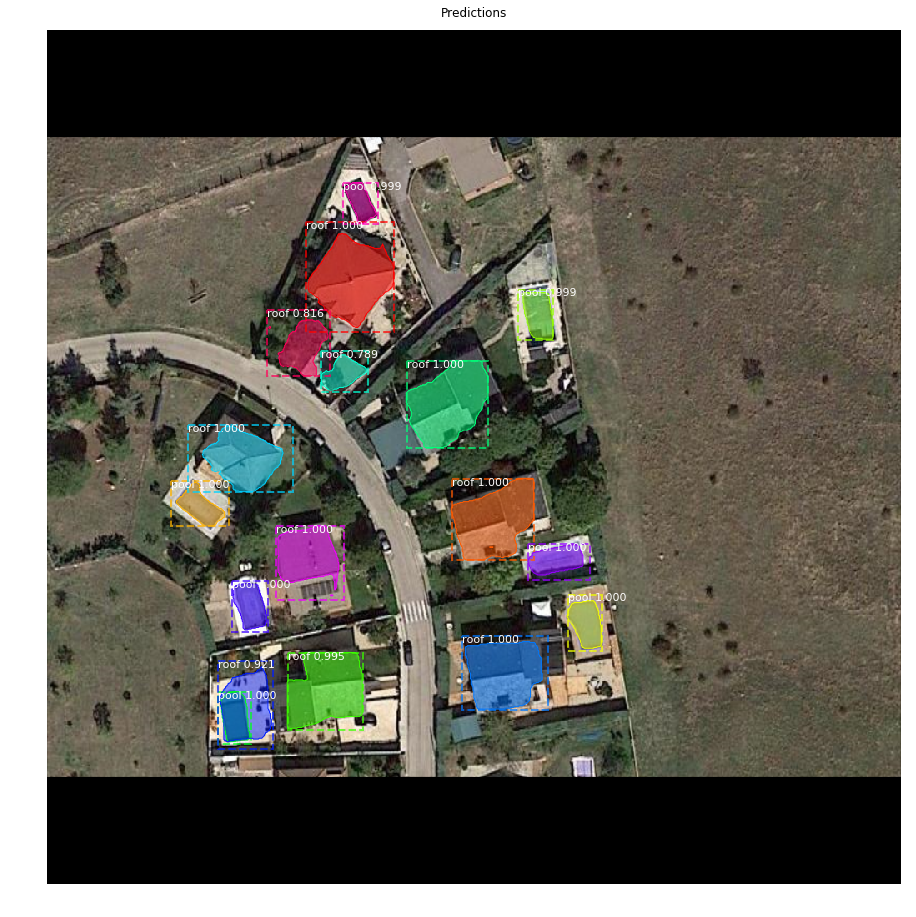

In [66]:
image_id = random.choice(val_set.image_ids)
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(val_set, cfg, image_id, use_mini_mask=False)
info = val_set.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       val_set.image_reference(image_id)))

# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            val_set.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

## Run a good `val_set` segmentation image (houses type of image)

In [140]:
for i in range(len(val_set.image_ids)):
    print(i, val_set.image_reference(i))

0 C:\Users\casiopa\CURSOS\_TheBridge-DS\thebridgedsftjun21-Ana\3-Machine Learning\proyectos\Mask_RCNN\data\maps\val\aravaca 2021-09-12 164114.png
1 C:\Users\casiopa\CURSOS\_TheBridge-DS\thebridgedsftjun21-Ana\3-Machine Learning\proyectos\Mask_RCNN\data\maps\val\aravaca 2021-09-12 164416.png
2 C:\Users\casiopa\CURSOS\_TheBridge-DS\thebridgedsftjun21-Ana\3-Machine Learning\proyectos\Mask_RCNN\data\maps\val\aravaca 2021-09-12 164644.png
3 C:\Users\casiopa\CURSOS\_TheBridge-DS\thebridgedsftjun21-Ana\3-Machine Learning\proyectos\Mask_RCNN\data\maps\val\arguelles 2021-09-12 163324.png
4 C:\Users\casiopa\CURSOS\_TheBridge-DS\thebridgedsftjun21-Ana\3-Machine Learning\proyectos\Mask_RCNN\data\maps\val\pozuelo 2021-09-13 200107.png
5 C:\Users\casiopa\CURSOS\_TheBridge-DS\thebridgedsftjun21-Ana\3-Machine Learning\proyectos\Mask_RCNN\data\maps\val\pozuelo 2021-09-13 200320.png
6 C:\Users\casiopa\CURSOS\_TheBridge-DS\thebridgedsftjun21-Ana\3-Machine Learning\proyectos\Mask_RCNN\data\maps\val\pozuel

image ID: dataset.somosaguas 2021-09-13 194952.png (9) C:\Users\casiopa\CURSOS\_TheBridge-DS\thebridgedsftjun21-Ana\3-Machine Learning\proyectos\Mask_RCNN\data\maps\val\somosaguas 2021-09-13 194952.png
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (17,)                 min:    1.00000  max:    2.00000  int32
gt_bbox                  shape: (17, 4)               min:    1.00000  max: 1023.00000  int32
gt_mask                  shape: (1024, 1024, 17)      min:    0.00000  max:    1.00000  bool


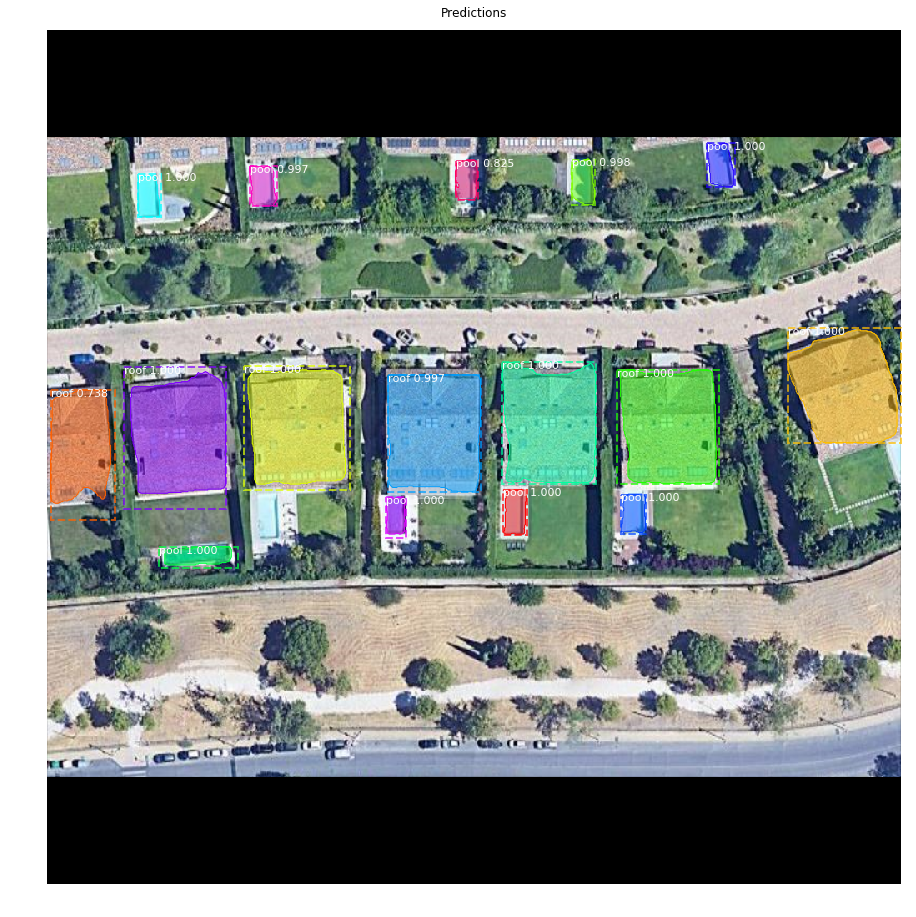

In [170]:
image_id = val_set.image_ids[9]
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(val_set, cfg, image_id, use_mini_mask=False)
info = val_set.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       val_set.image_reference(image_id)))

# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            val_set.class_names, r['scores'], ax=ax,
                            title="Predictions")
plt.savefig('images/Image_predicted_01.png', bbox_inches='tight', transparent=True)

log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

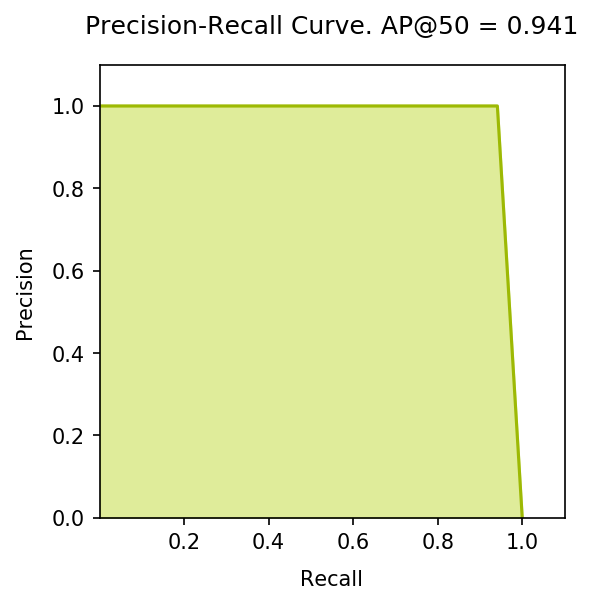

In [171]:
# Draw precision-recall curve
AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])

# Plot the Precision-Recall curve
fig, ax = plt.subplots(1, figsize=(4, 4), dpi=150)
ax.set_title("Precision-Recall Curve. AP@50 = {:.3f}".format(AP), pad=15)
plt.xlabel('Recall', labelpad=8)
plt.xticks([0.2, 0.4, 0.6, 0.8, 1])
plt.ylabel('Precision', labelpad=8)
ax.set_ylim(0, 1.1)
ax.set_xlim(0, 1.1)
plt.fill_between(recalls, precisions, color = '#B1D004', alpha=0.4)
_ = ax.plot(recalls, precisions, color = '#9DB904')

plt.savefig('images/AUC-PR_01.png', bbox_inches='tight', transparent=True)

In [172]:
def plot_overlaps(gt_class_ids, pred_class_ids, pred_scores,
                  overlaps, class_names, threshold=0.5):
    """Draw a grid showing how ground truth objects are classified.
    gt_class_ids: [N] int. Ground truth class IDs
    pred_class_id: [N] int. Predicted class IDs
    pred_scores: [N] float. The probability scores of predicted classes
    overlaps: [pred_boxes, gt_boxes] IoU overlaps of predictions and GT boxes.
    class_names: list of all class names in the dataset
    threshold: Float. The prediction probability required to predict a class
    """
    gt_class_ids = gt_class_ids[gt_class_ids != 0]
    pred_class_ids = pred_class_ids[pred_class_ids != 0]
    
    colors = [(252/255, 255/255, 238/255), (123/255, 146/255, 1/255)]
    cm = LinearSegmentedColormap.from_list(
        "Custom", colors, N=20)

    plt.figure(figsize=(12, 10))
    plt.imshow(overlaps, interpolation='nearest', cmap=cm)
    plt.yticks(np.arange(len(pred_class_ids)),
               ["{} ({:.2f})".format(class_names[int(id)], pred_scores[i])
                for i, id in enumerate(pred_class_ids)])
    plt.xticks(np.arange(len(gt_class_ids)),
               [class_names[int(id)] for id in gt_class_ids], rotation=90)

    thresh = overlaps.max() / 2.
    for i, j in itertools.product(range(overlaps.shape[0]),
                                  range(overlaps.shape[1])):
        text = ""
        if overlaps[i, j] > threshold:
            text = "match" if gt_class_ids[j] == pred_class_ids[i] else "wrong"
        color = ("white" if overlaps[i, j] > thresh
                 else "black" if overlaps[i, j] > 0
                 else "grey")
        plt.text(j, i, "{:.3f}\n{}".format(overlaps[i, j], text),
                 horizontalalignment="center", verticalalignment="center",
                 fontsize=9, color=color)

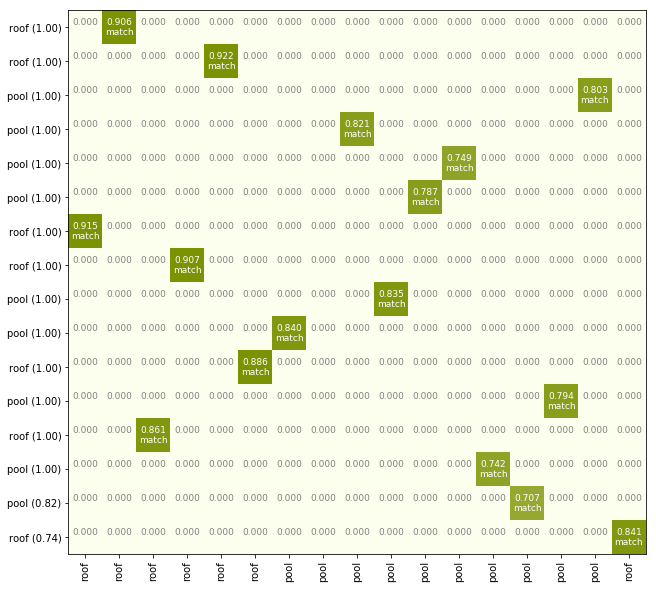

In [173]:
# Grid of ground truth objects and their predictions
plot_overlaps(gt_class_id, r['class_ids'], r['scores'], overlaps, val_set.class_names)
plt.savefig('images/overlap_matrix_01.png', bbox_inches='tight', transparent=True)

## Run a bad `val_set` segmentation image (houses type of image)

image ID: dataset.pozuelo 2021-09-13 200628.png (8) C:\Users\casiopa\CURSOS\_TheBridge-DS\thebridgedsftjun21-Ana\3-Machine Learning\proyectos\Mask_RCNN\data\maps\val\pozuelo 2021-09-13 200628.png
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 16)               min:    0.00000  max: 1024.00000  int32
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (8,)                  min:    1.00000  max:    3.00000  int32
gt_bbox                  shape: (8, 4)                min:    1.00000  max:  896.00000  int32
gt_mask                  shape: (1024, 1024, 8)       min:    0.00000  max:    1.00000  bool


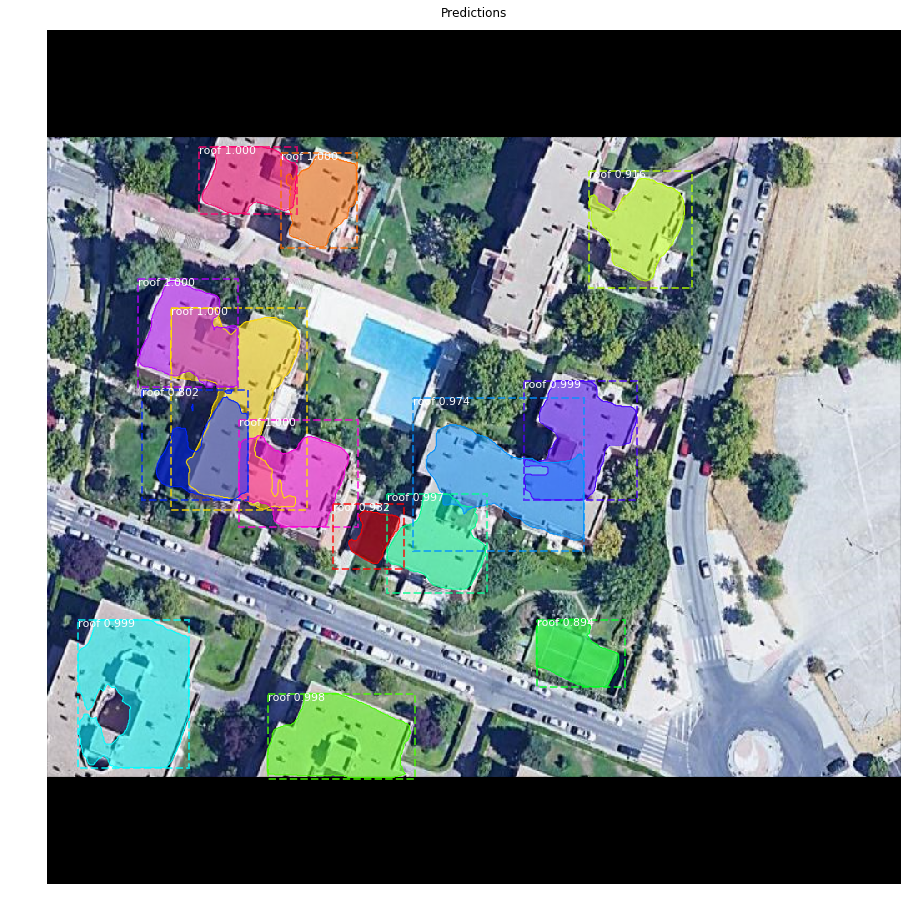

In [174]:
image_id = val_set.image_ids[8]
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(val_set, cfg, image_id, use_mini_mask=False)
info = val_set.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       val_set.image_reference(image_id)))

# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            val_set.class_names, r['scores'], ax=ax,
                            title="Predictions")
plt.savefig('images/Image_predicted_02.png', bbox_inches='tight', transparent=True)

log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

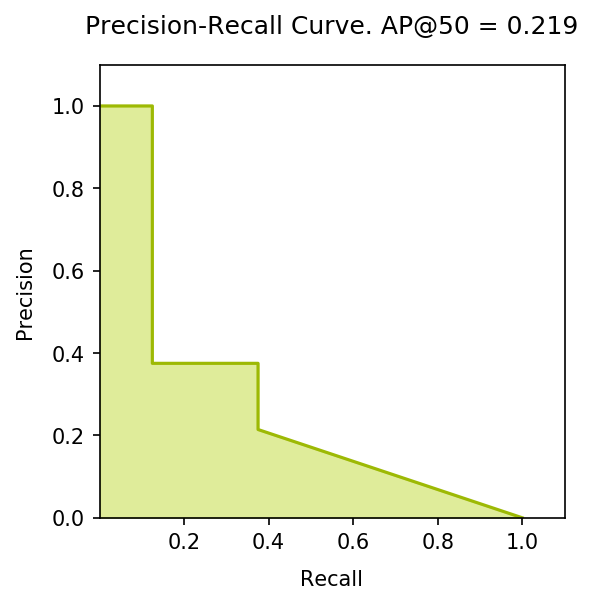

In [175]:
# Draw precision-recall curve
AP, precisions, recalls, overlaps = utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                                          r['rois'], r['class_ids'], r['scores'], r['masks'])

# Plot the Precision-Recall curve
fig, ax = plt.subplots(1, figsize=(4, 4), dpi=150)
ax.set_title("Precision-Recall Curve. AP@50 = {:.3f}".format(AP), pad=15)
plt.xlabel('Recall', labelpad=8)
plt.xticks([0.2, 0.4, 0.6, 0.8, 1])
plt.ylabel('Precision', labelpad=8)
ax.set_ylim(0, 1.1)
ax.set_xlim(0, 1.1)
plt.fill_between(recalls, precisions, color = '#B1D004', alpha=0.4)
_ = ax.plot(recalls, precisions, color = '#9DB904')

plt.savefig('images/AUC-PR_02.png', bbox_inches='tight', transparent=True)

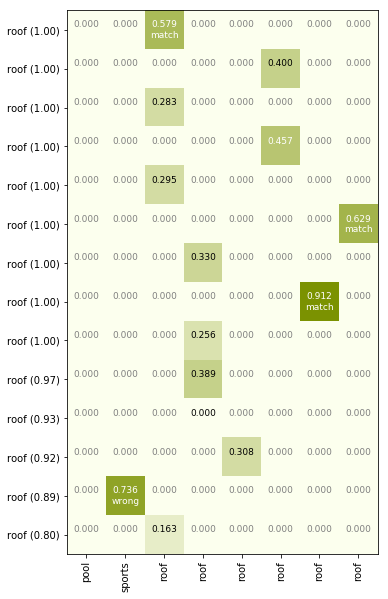

In [176]:
# Grid of ground truth objects and their predictions
plot_overlaps(gt_class_id, r['class_ids'], r['scores'], overlaps, val_set.class_names)
plt.savefig('images/overlap_matrix_02.png', bbox_inches='tight', transparent=True)

### Compute mAP @ IoU=50 on Batch of Images

In [77]:
# Compute VOC-style Average Precision
def compute_batch_ap(image_ids):
    APs = []
    for image_id in image_ids:
        # Load image
        image, image_meta, gt_class_id, gt_bbox, gt_mask =\
            modellib.load_image_gt(dataset, config,
                                   image_id, use_mini_mask=False)
        # Run object detection
        results = model.detect([image], verbose=0)
        # Compute AP
        r = results[0]
        AP, precisions, recalls, overlaps =\
            utils.compute_ap(gt_bbox, gt_class_id, gt_mask,
                              r['rois'], r['class_ids'], r['scores'], r['masks'])
        APs.append(AP)
    return APs

# Pick a set of random images
image_ids = np.random.choice(dataset.image_ids, 10)
APs = compute_batch_ap(image_ids)
print("mAP @ IoU=50: ", np.mean(APs))

mAP @ IoU=50:  0.6210812995616622


## Step by Step Prediction

## Stage 1: Region Proposal Network

The Region Proposal Network (RPN) runs a lightweight binary classifier on a lot of boxes (anchors) over the image and returns object/no-object scores. Anchors with high *objectness* score (positive anchors) are passed to the stage two to be classified.

Often, even positive anchors don't cover objects fully. So the RPN also regresses a refinement (a delta in location and size) to be applied to the anchors to shift it and resize it a bit to the correct boundaries of the object.

### 1.a RPN Targets

The RPN targets are the training values for the RPN. To generate the targets, we start with a grid of anchors that cover the full image at different scales, and then we compute the IoU of the anchors with ground truth object. Positive anchors are those that have an IoU >= 0.7 with any ground truth object, and negative anchors are those that don't cover any object by more than 0.3 IoU. Anchors in between (i.e. cover an object by IoU >= 0.3 but < 0.7) are considered neutral and excluded from training.

To train the RPN regressor, we also compute the shift and resizing needed to make the anchor cover the ground truth object completely.

In [46]:
# Generate RPN trainig targets
# target_rpn_match is 1 for positive anchors, -1 for negative anchors
# and 0 for neutral anchors.
target_rpn_match, target_rpn_bbox = modellib.build_rpn_targets(
    image.shape, model.anchors, gt_class_id, gt_bbox, model.config)
log("target_rpn_match", target_rpn_match)
log("target_rpn_bbox", target_rpn_bbox)

positive_anchor_ix = np.where(target_rpn_match[:] == 1)[0]
negative_anchor_ix = np.where(target_rpn_match[:] == -1)[0]
neutral_anchor_ix = np.where(target_rpn_match[:] == 0)[0]
positive_anchors = model.anchors[positive_anchor_ix]
negative_anchors = model.anchors[negative_anchor_ix]
neutral_anchors = model.anchors[neutral_anchor_ix]
log("positive_anchors", positive_anchors)
log("negative_anchors", negative_anchors)
log("neutral anchors", neutral_anchors)

# Apply refinement deltas to positive anchors
refined_anchors = utils.apply_box_deltas(
    positive_anchors,
    target_rpn_bbox[:positive_anchors.shape[0]] * model.config.RPN_BBOX_STD_DEV)
log("refined_anchors", refined_anchors, )


target_rpn_match         shape: (261888,)             min:   -1.00000  max:    1.00000  int32
target_rpn_bbox          shape: (256, 4)              min:   -2.43068  max:    2.10938  float64
positive_anchors         shape: (68, 4)               min:    0.00000  max: 1032.00000  float64
negative_anchors         shape: (188, 4)              min:  -64.00000  max: 1053.25483  float64
neutral anchors          shape: (261632, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (68, 4)               min:    2.00000  max: 1023.00006  float32


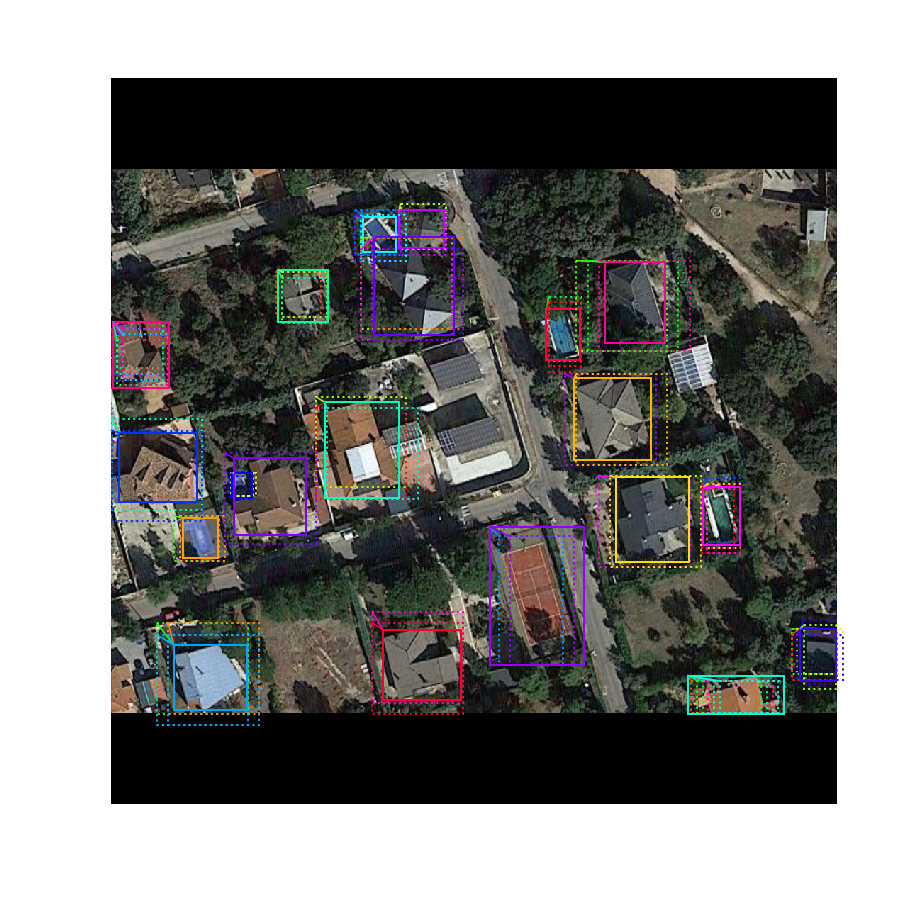

In [47]:
# Display positive anchors before refinement (dotted) and
# after refinement (solid).
visualize.draw_boxes(image, boxes=positive_anchors, refined_boxes=refined_anchors, ax=get_ax())

### 1.b RPN Predictions

Here we run the RPN graph and display its predictions.

In [48]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.08847  max:    1.07283  float32
refined_anchors          shape: (1, 6000, 4)          min:   -0.16836  max:    1.06660  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (967,)                min:    0.00000  max: 5997.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


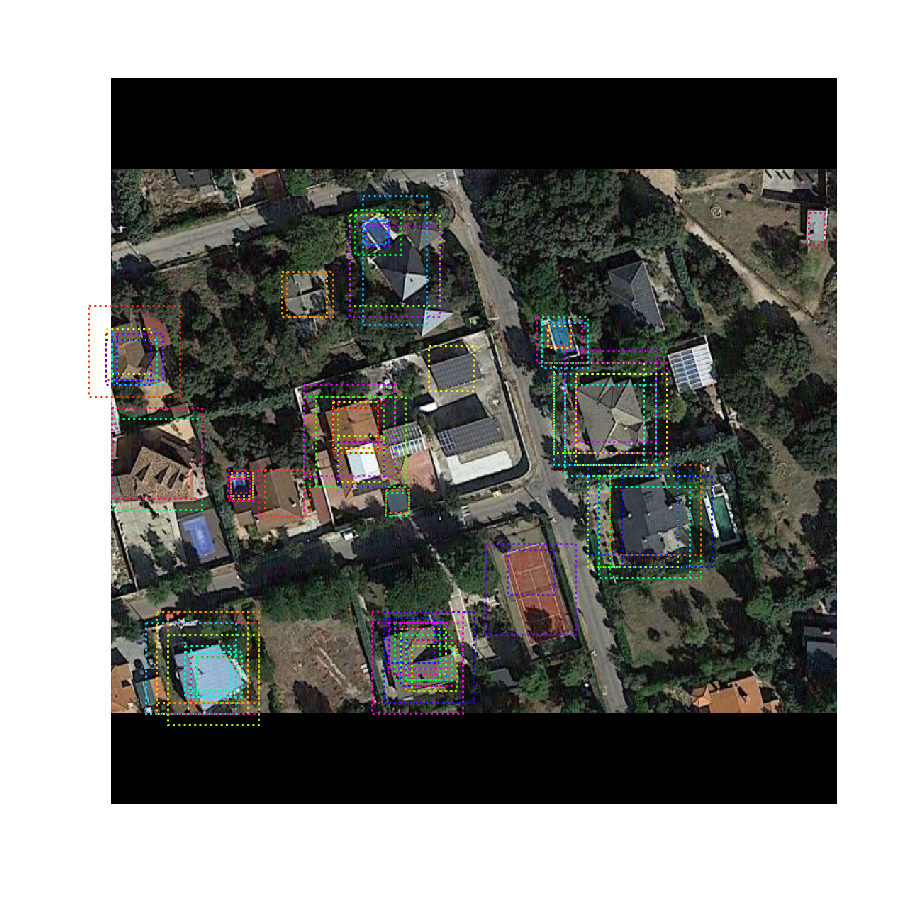

In [49]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

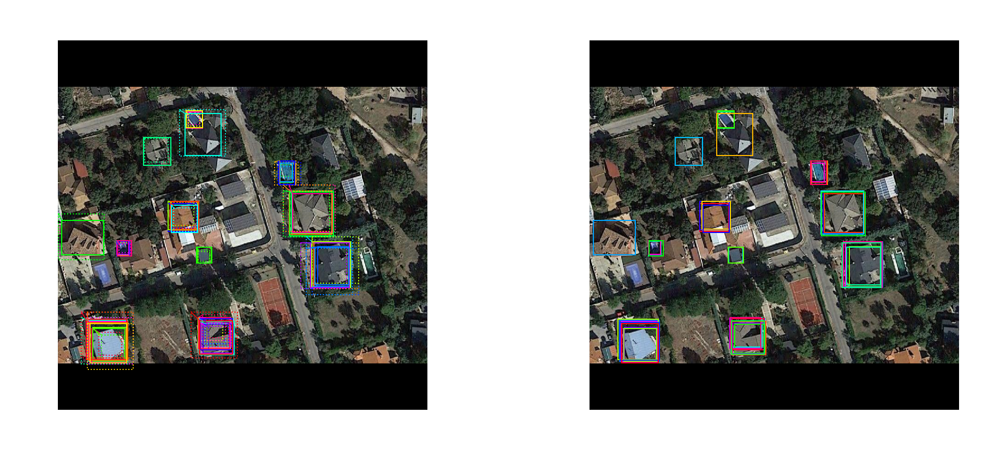

In [50]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

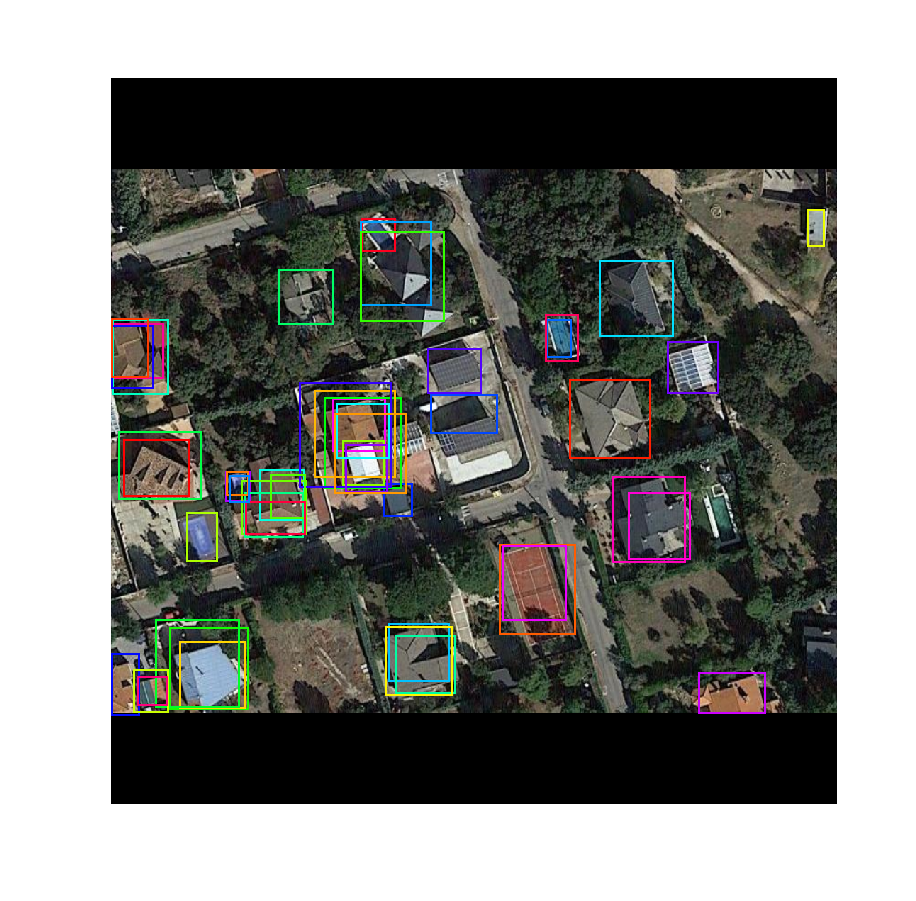

In [51]:
# Show refined anchors after non-max suppression
limit = 50
ixs = rpn["post_nms_anchor_ix"][:limit]
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[ixs], ax=get_ax())

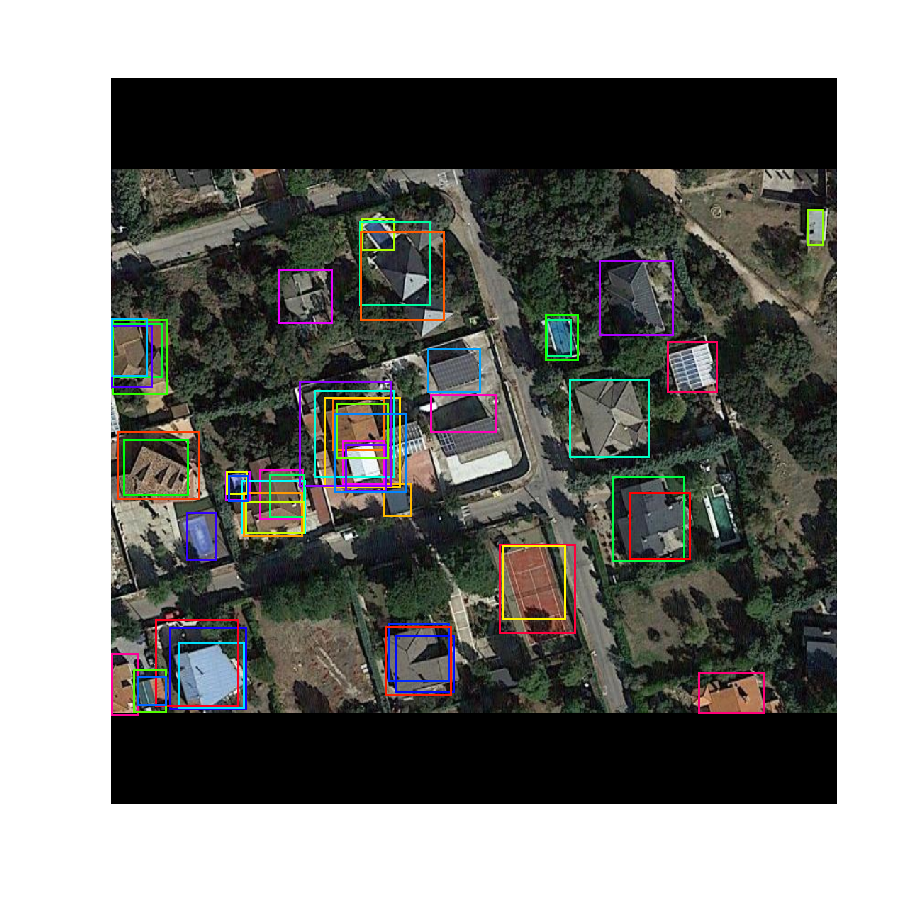

In [52]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

## Stage 2: Proposal Classification

This stage takes the region proposals from the RPN and classifies them.

### 2.a Proposal Classification

Run the classifier heads on proposals to generate class propbabilities and bounding box regressions.

In [53]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 4, 4)       min:   -5.42141  max:    4.65082  float32
masks                    shape: (1, 100, 28, 28, 4)   min:    0.00000  max:    1.00000  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    3.00000  float32


18 detections: ['roof' 'pool' 'pool' 'roof' 'roof' 'roof' 'roof' 'roof' 'roof' 'pool'
 'pool' 'roof' 'pool' 'roof' 'sports' 'pool' 'roof' 'roof']


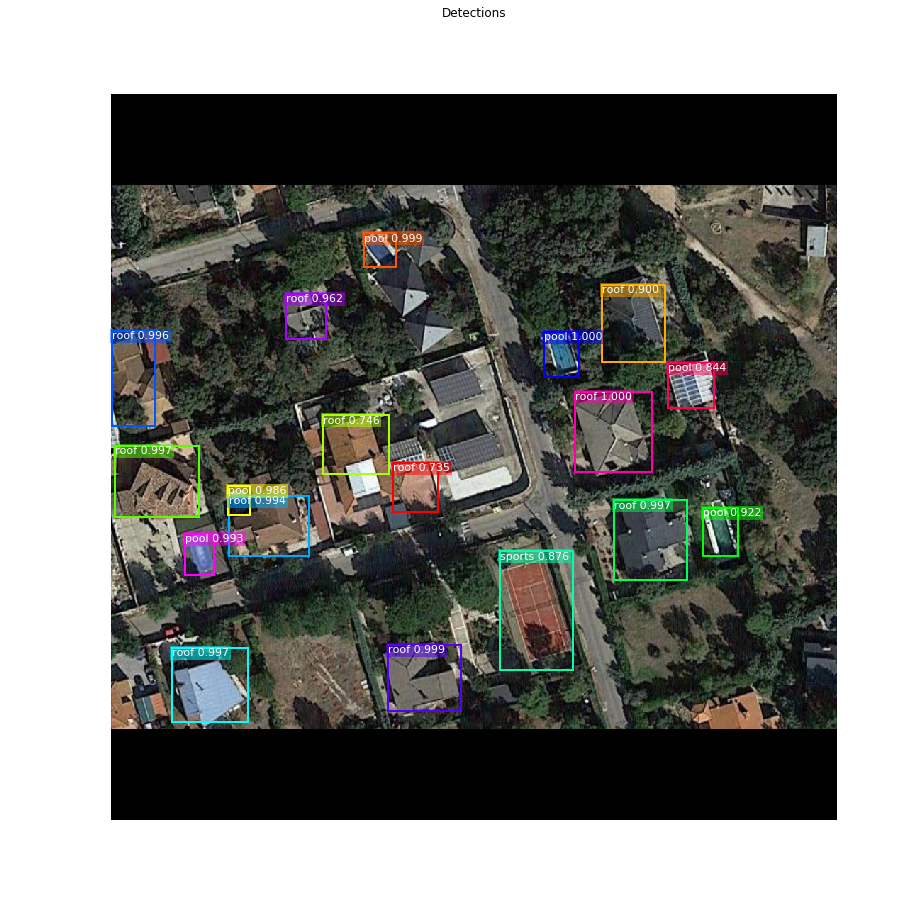

In [55]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.c Step by Step Detection

Here we dive deeper into the process of processing the detections.

In [56]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

967 Valid proposals out of 1000
159 Positive ROIs
[('BG', 841), ('pool', 39), ('roof', 116), ('sports', 4)]


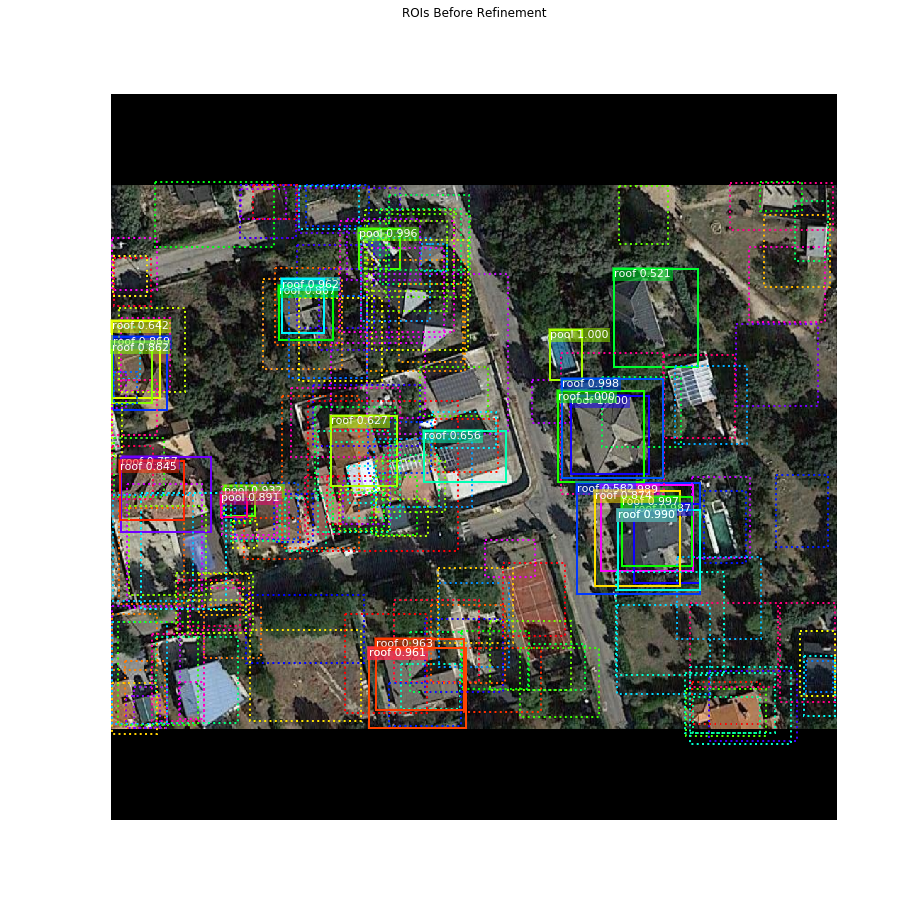

In [57]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

#### Apply Bounding Box Refinement

roi_bbox_specific        shape: (1000, 4)             min:   -3.65322  max:    2.97980  float32
refined_proposals        shape: (1000, 4)             min:  -17.00000  max: 1023.00000  int32


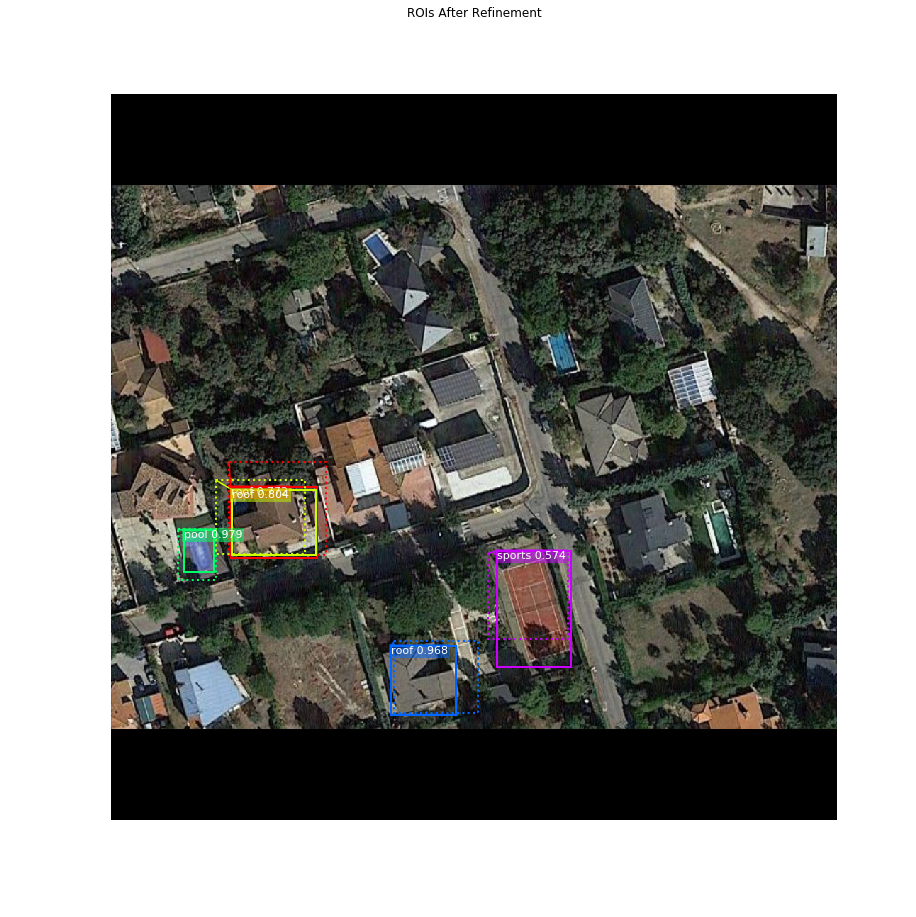

In [59]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
# ids = np.arange(roi_boxes.shape[0])  # Display all
limit = 5
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

#### Filter Low Confidence Detections

In [60]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 159 detections:
[  0   1   2   3   5   6   7   8   9  10  12  13  15  17  18  22  24  27
  28  29  30  31  32  38  39  41  44  48  49  50  53  54  55  59  64  66
  67  68  69  70  72  73  77  84  86  87  93  95 100 104 106 108 111 117
 121 123 135 136 142 143 150 153 158 162 164 174 179 186 189 191 201 203
 210 223 227 240 242 243 245 255 266 270 273 274 280 281 283 285 287 296
 305 306 310 318 319 330 336 337 360 365 369 375 385 390 400 414 419 420
 422 446 447 449 450 452 455 463 471 473 475 478 492 508 515 516 518 519
 531 541 556 565 578 587 610 614 634 636 645 673 680 704 708 718 732 748
 754 756 781 795 799 800 805 812 866 869 926 950 959 965 966]


In [61]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.7 confidence. Keep 122:
[  0   1   2   3   5   6   7   8   9  10  12  13  22  24  27  28  29  30
  32  38  39  41  44  49  50  53  54  55  64  66  68  69  70  72  73  77
  84  86  87  93  95 100 104 106 108 117 121 123 135 136 142 143 150 153
 162 164 174 179 186 191 201 210 223 227 240 243 255 266 270 280 281 283
 287 305 306 310 318 330 336 337 360 365 369 375 385 390 400 419 422 455
 463 471 473 475 478 508 516 518 519 531 556 565 578 587 614 634 636 673
 704 718 732 748 754 756 799 800 805 812 869 926 950 959]


#### Per-Class Non-Max Suppression

In [62]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

roof                  : [  0   1   2   3   7   9  10  13  22  24  27  29  30  32  38  41  44  50
  53  54  64  68  70  72  73  77  84  86  87  93  95 106 117 121 123 135
 142 143 150 153 162 186 227 240 255 266 270 280 281 283 287 305 306 310
 318 330 336 337 360 365 369 375 385 390 400 419 422 455 463 471 473 475
 478 516 519 531 565 578 587 634 673 704 732 748 754 756 799 805 869 926
 959] -> [  3 162   9  13   0 756  93 336 754  87  86]
pool                  : [  5   6   8  12  28  39  49  55  66  69 100 104 108 136 164 174 179 191
 201 210 223 243 508 556 614 718 800 812 950] -> [ 12   6 179   5  69 800]
sports                : [518 636] -> [518]

Kept after per-class NMS: 18
[  0   3   5   6   9  12  13  69  86  87  93 162 179 336 518 754 756 800]


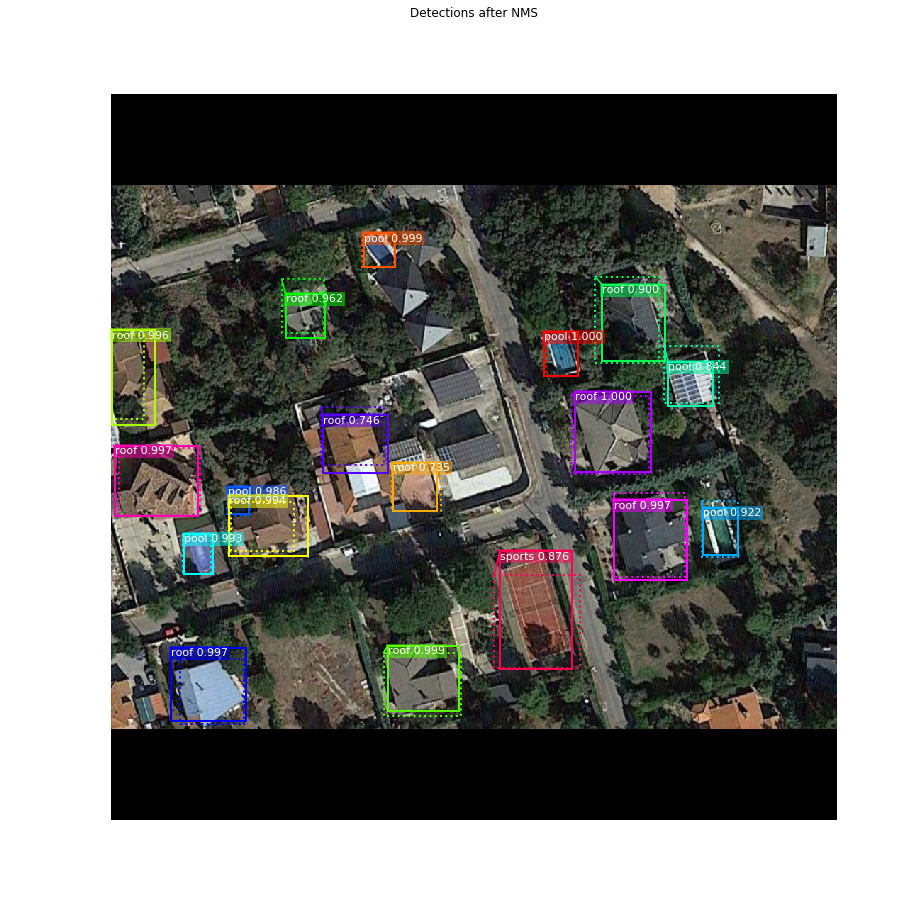

In [63]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

## Stage 3: Generating Masks

This stage takes the detections (refined bounding boxes and class IDs) from the previous layer and runs the mask head to generate segmentation masks for every instance.

### 3.a Mask Targets

These are the training targets for the mask branch

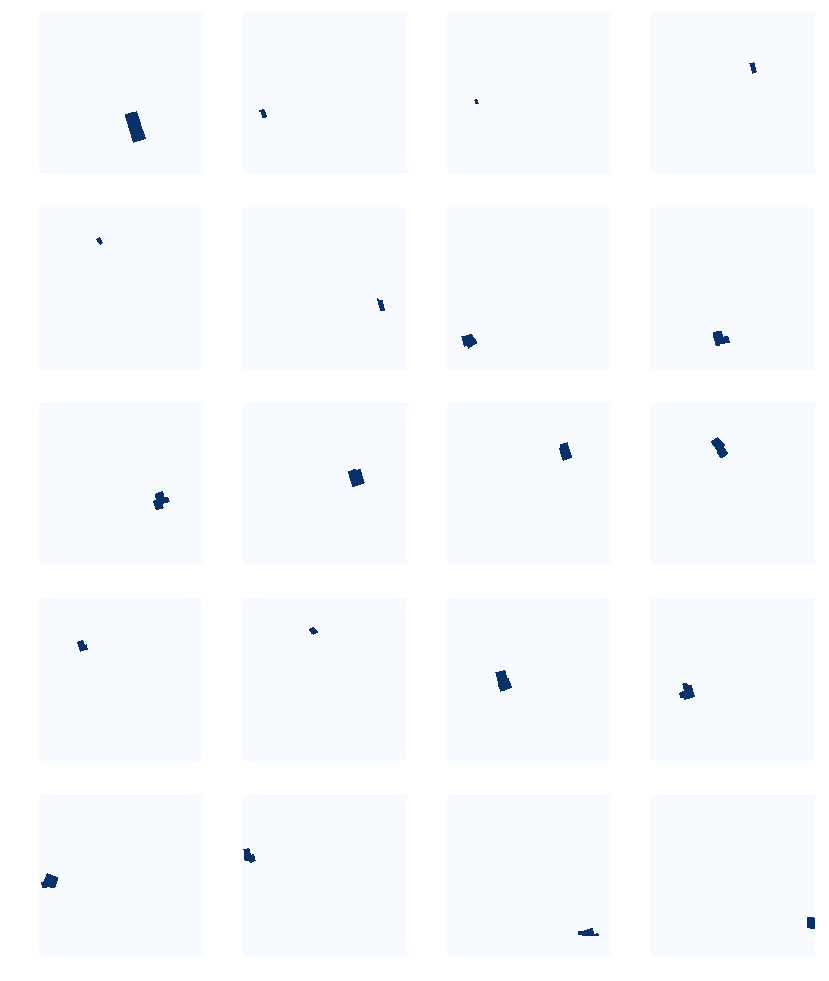

In [64]:
display_images(np.transpose(gt_mask, [2, 0, 1]), cmap="Blues")

### 3.b Predicted Masks

In [65]:
# Get predictions of mask head
mrcnn = model.run_graph([image], [
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
])

# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

detections               shape: (1, 100, 6)           min:    0.00000  max:    3.00000  float32
masks                    shape: (1, 100, 28, 28, 4)   min:    0.00000  max:    1.00000  float32
18 detections: ['roof' 'pool' 'pool' 'roof' 'roof' 'roof' 'roof' 'roof' 'roof' 'pool'
 'pool' 'roof' 'pool' 'roof' 'sports' 'pool' 'roof' 'roof']


In [66]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (18, 28, 28)          min:    0.00000  max:    1.00000  float32
det_masks                shape: (18, 1024, 1024)      min:    0.00000  max:    1.00000  bool


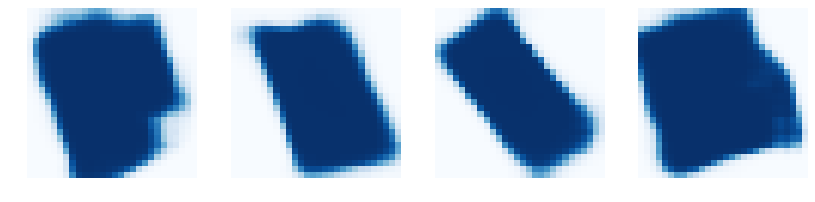

In [67]:
display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

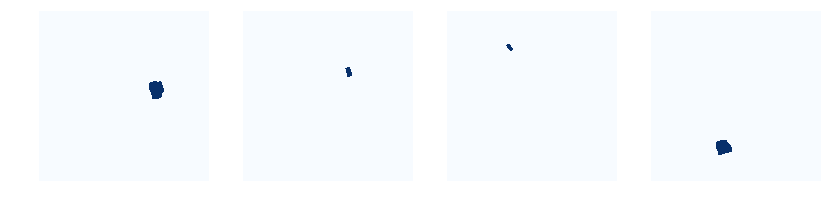

In [68]:
display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

## Visualize Activations

In some cases it helps to look at the output from different layers and visualize them to catch issues and odd patterns.

In [72]:
# Get activations of a few sample layers
activations = model.run_graph([image], [
    ("input_image",        tf.identity(model.keras_model.get_layer("input_image").output)),
    ("res2c_out",          model.keras_model.get_layer("res2c_out").output),
    ("res3c_out",          model.keras_model.get_layer("res3c_out").output),
    ("res4w_out",          model.keras_model.get_layer("res4w_out").output),  # for resnet100
    ("rpn_bbox",           model.keras_model.get_layer("rpn_bbox").output),
    ("roi",                model.keras_model.get_layer("ROI").output),
])

input_image              shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10001  float32
res2c_out                shape: (1, 256, 256, 256)    min:    0.00000  max:   28.04225  float32
res3c_out                shape: (1, 128, 128, 512)    min:    0.00000  max:   28.80073  float32
res4w_out                shape: (1, 64, 64, 1024)     min:    0.00000  max:   58.27610  float32
rpn_bbox                 shape: (1, 261888, 4)        min:  -11.87022  max:   50.52618  float32
roi                      shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


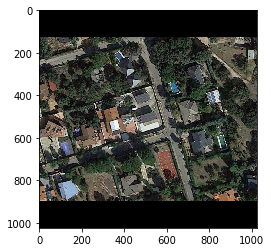

In [73]:
# Input image (normalized)
_ = plt.imshow(modellib.unmold_image(activations["input_image"][0],config))

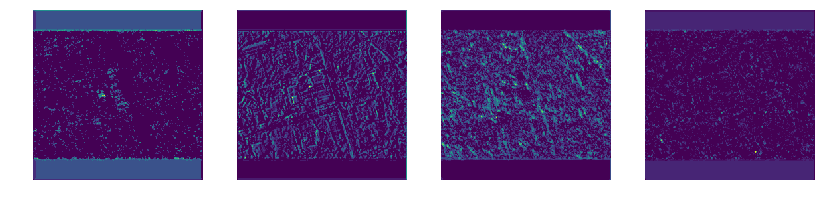

In [74]:
# Backbone feature map
display_images(np.transpose(activations["res2c_out"][0,:,:,:4], [2, 0, 1]), cols=4)